In [1]:
# If needed (uncomment to run once):
# !pip install ecmwf-opendata xarray cfgrib eccodes metpy plotly requests

import os, glob, json, datetime as dt, numpy as np, xarray as xr, plotly.graph_objects as go
from plotly.figure_factory import create_quiver
import metpy.calc as mpcalc
from metpy.units import units

# ⚙️ Choose a run (UTC), area and steps like the OpenCharts notebooks do
DATE  = dt.datetime.utcnow().strftime("%Y-%m-%d")     # e.g. '2025-08-26'
TIME  = "00"                                          # '00'/'06'/'12'/'18'
STEPS = list(range(0, 49, 3))                         # 0..48 by 3h (adjust as you wish)

# Region of interest (global grid; we’ll just plot a subset later)
# Tip: keep default 'domain': 'g' for global; we’ll slice in xarray for your bbox.
OUTDIR = "./data/ifs"
os.makedirs(OUTDIR, exist_ok=True)



In [2]:
from ecmwf.opendata import Client

client = Client(source="ecmwf", beta=False)  # mirrors 'Download_medium_range_product_example.ipynb'

req_sl = {
    "date":   0,
    "time":   0,
    "step": STEPS, # lead times (hours)
    "type":   "fc",
    "stream": "oper",                # HRES deterministic
    "param":  ["10u","10v","100u","100v","10fg","msl"],  # wind@10m/100m, gust, MSLP
    "target": os.path.join(OUTDIR, f"ifs_sl_{DATE}_{TIME}.grib"),
}

client.retrieve(req_sl)
req_sl["target"]

from ecmwf.opendata import Client

client = Client(source="ecmwf", beta=False)  # mirrors 'Download_medium_range_product_example.ipynb'

req_slc = {
    "date":   0,
    "time":   0,
    "step": STEPS, # lead times (hours)
    "type":   "fc",
    "stream": "oper",                # HRES deterministic
    "param":  ["100u","100v","msl"],  # wind@10m/100m, gust, MSLP
    "target": os.path.join(OUTDIR, f"ifs_slc_{DATE}_{TIME}.grib"),
}

client.retrieve(req_slc)
req_slc["target"]



'./data/ifs/ifs_slc_2025-08-26_00.grib'

In [3]:
OUT_PL = os.path.join(OUTDIR, f"ifs_pl_{DATE}_{TIME}.grib2")

req_pl = {
    "date":   DATE, "time": TIME, "step": STEPS,
    "type":   "fc", "stream": "oper",
    "model":  "ifs",
    "grid":   "0.25/0.25",
    "levtype":"pl",
    "levelist":"850/200",            # just what we need for wind context
    "param":  ["u","v"],
    "class":  "od", "domain":"g",
    "target": OUT_PL,
}
client.retrieve(req_pl)
OUT_PL


MARS post-processing keywords {'grid'} not supported
The following keywords {'domain'} are ignored
                                                                                                                        

'./data/ifs/ifs_pl_2025-08-26_00.grib2'

In [7]:
import xarray as xr

ds = xr.open_dataset("./data/ifs/ifs_sl_2025-08-26_00.grib")
ds

skipping variable: paramId==228246 shortName='u100'
Traceback (most recent call last):
  File "/home/sdhinakaran/micromamba/envs/StreamViz/lib/python3.11/site-packages/cfgrib/dataset.py", line 725, in build_dataset_components
    dict_merge(variables, coord_vars)
  File "/home/sdhinakaran/micromamba/envs/StreamViz/lib/python3.11/site-packages/cfgrib/dataset.py", line 641, in dict_merge
    raise DatasetBuildError(
cfgrib.dataset.DatasetBuildError: key present and new value is different: key='heightAboveGround' value=Variable(dimensions=(), data=10.0) new_value=Variable(dimensions=(), data=100.0)
skipping variable: paramId==228247 shortName='v100'
Traceback (most recent call last):
  File "/home/sdhinakaran/micromamba/envs/StreamViz/lib/python3.11/site-packages/cfgrib/dataset.py", line 725, in build_dataset_components
    dict_merge(variables, coord_vars)
  File "/home/sdhinakaran/micromamba/envs/StreamViz/lib/python3.11/site-packages/cfgrib/dataset.py", line 641, in dict_merge
    rais

<xarray.Dataset> Size: 282MB
Dimensions:            (step: 17, latitude: 721, longitude: 1440)
Coordinates:
    time               datetime64[ns] 8B ...
  * step               (step) timedelta64[ns] 136B 00:00:00 ... 2 days 00:00:00
    heightAboveGround  float64 8B ...
  * latitude           (latitude) float64 6kB 90.0 89.75 89.5 ... -89.75 -90.0
  * longitude          (longitude) float64 12kB -180.0 -179.8 ... 179.5 179.8
    valid_time         (step) datetime64[ns] 136B ...
    meanSea            float64 8B ...
Data variables:
    max_i10fg          (step, latitude, longitude) float32 71MB ...
    msl                (step, latitude, longitude) float32 71MB ...
    u10                (step, latitude, longitude) float32 71MB ...
    v10                (step, latitude, longitude) float32 71MB ...
Attributes:
    GRIB_edition:            2
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2025-08-26T22:32 GRIB to CDM+CF via cfgrib-0.9.1...

In [12]:
import requests, pathlib

# Example: 2 timesteps of u/v @ 10m over a small bbox (adjust bbox, timesteps)
bbox = (18.0, 58.0, 26.0, 62.0)  # lon_min, lat_min, lon_max, lat_max (EPSG:4326)
WFS = (
    "http://opendata.fmi.fi/download"
    "?producer=harmonie_scandinavia_surface"
    "&param=windums,windvms,windgust&format=netcdf"
    f"&bbox={bbox[1]},{bbox[0]},{bbox[3]},{bbox[2]}"   # lat_min,lon_min,lat_max,lon_max
    "&projection=EPSG:4326&timesteps=4"
)

OUT_NC = "./data/harmonie_uv.nc"
with requests.get(WFS, stream=True, timeout=300) as r:
    r.raise_for_status()
    with open(OUT_NC, "wb") as f:
        for chunk in r.iter_content(1<<20):
            f.write(chunk)

pathlib.Path(OUT_NC).exists(), OUT_NC


(True, './data/harmonie_uv.nc')

In [42]:
ds = xr.open_dataset("./data/harmonie_uv.nc")
ds

<xarray.Dataset> Size: 3MB
Dimensions:                 (time: 4, lat: 356, lon: 178, time_h: 4,
                             time_bounds: 2)
Coordinates:
  * time                    (time) datetime64[ns] 32B 2025-08-26T15:00:00 ......
  * lat                     (lat) float32 1kB 18.0 18.02 18.05 ... 25.98 26.0
  * lon                     (lon) float32 712B 58.0 58.02 58.05 ... 61.98 62.0
  * time_h                  (time_h) datetime64[ns] 32B 2025-08-26T15:00:00 ....
Dimensions without coordinates: time_bounds
Data variables:
    crs                     int16 2B ...
    eastward_wind_23        (time, lat, lon) float32 1MB ...
    northward_wind_24       (time, lat, lon) float32 1MB ...
    time_bounds_h           (time_h, time_bounds) datetime64[ns] 64B ...
    wind_speed_of_gust_417  (time_h, lat, lon) float32 1MB ...
Attributes:
    Conventions:  CF-1.6
    title:        <title>
    institution:  fmi.fi
    source:       <producer>

In [4]:
# Helper to open one variable from a multi-message GRIB by shortName
def open_grib_var(path, short_name, filter_keys=None):
    bk = {"filter_by_keys": {"shortName": short_name}}
    if filter_keys:
        bk["filter_by_keys"].update(filter_keys)
    ds = xr.open_dataset(path, engine="cfgrib", backend_kwargs=bk)
    # Grab the single data var regardless of naming ('u100' vs '100u', etc.)
    var = list(ds.data_vars)[0]
    return ds[var]

In [8]:
# --- Single levels
u10  = open_grib_var(req_sl["target"], "10u")
v10  = open_grib_var(req_sl["target"], "10v")
u100 = open_grib_var(req_slc["target"], "100u")
v100 = open_grib_var(req_slc["target"], "100v")
gust = open_grib_var(req_sl["target"], "max_i10fg")
msl  = open_grib_var(req_sl["target"], "msl") / 100.0  # Pa → hPa

In [10]:
# --- Pressure levels
u_pl = open_grib_var(OUT_PL, "u")  # dims: time, isobaricInhPa, lat, lon
v_pl = open_grib_var(OUT_PL, "v")

u850 = u_pl.sel(isobaricInhPa=850)
v850 = v_pl.sel(isobaricInhPa=850)
u200 = u_pl.sel(isobaricInhPa=200)
v200 = v_pl.sel(isobaricInhPa=200)

In [13]:
# --- Regional HARMONIE (optional)
if os.path.exists(OUT_NC):
    hrm = xr.open_dataset(OUT_NC)
    # These are typically 10 m components:
    u10_h = hrm["eastward_wind_23"]
    v10_h = hrm["northward_wind_24"]
    gust_h = hrm["wind_speed_of_gust_417"]

In [24]:
def heatmap(da, title, units="", zmin=None, zmax=None, colorscale="Viridis", height=650):
    lat, lon = da["latitude" if "latitude" in da.coords else "lat"], da["longitude" if "longitude" in da.coords else "lon"]
    Z = np.array(da)
    fig = go.Figure(go.Heatmap(z=Z, x=lon.values, y=lat.values, colorscale=colorscale,
                               zmin=zmin, zmax=zmax, colorbar=dict(title=units)))
    fig.update_layout(title=title, height=height, margin=dict(l=10,r=10,t=40,b=10),
                      xaxis_title="Longitude", yaxis_title="Latitude")
    return fig

def add_quiver(fig, u2d, v2d, lat, lon, thin_target=40, scale=0.18, name="Quiver"):
    ny, nx = u2d.shape
    step = max(1, int(max(nx, ny)/thin_target))

    # Slice and mesh
    lat_sub = lat[::step]
    lon_sub = lon[::step]
    u_sub = u2d[::step, ::step]
    v_sub = v2d[::step, ::step]

    Lon, Lat = np.meshgrid(lon_sub, lat_sub)  # both (N, M)

    # Flatten all
    x = Lon.flatten()
    y = Lat.flatten()
    u = u_sub.flatten()
    v = v_sub.flatten()

    Q = create_quiver(x, y, u, v, scale=scale, name=name)
    for tr in Q.data:
        fig.add_trace(tr)
    return fig


def contour_mslp(msl_hpa_2d, lat, lon, title=None):
    fig = go.Figure(go.Contour(z=msl_hpa_2d, x=lon, y=lat,
                               contours=dict(coloring="none", showlabels=True, labelfont=dict(size=10)),
                               line=dict(width=1)))
    if title: fig.update_layout(title=title, height=650)
    return fig


In [25]:
# Choose a time index to display
ti = 0  # change this to cycle through STEPS

u100_t = u100.isel(step=ti).metpy.convert_units("m/s").values
v100_t = v100.isel(step=ti).metpy.convert_units("m/s").values
ws100  = mpcalc.wind_speed(u100_t*units("m/s"), v100_t*units("m/s")).magnitude

lat = u100.latitude.values; lon = u100.longitude.values
ws_da = xr.DataArray(ws100, coords={"lat":lat, "lon":lon}, dims=("lat","lon"))

fig = heatmap(ws_da, f"100 m wind speed (IFS) — t+{int(STEPS[ti])} h", "m s⁻¹",
              zmin=0, zmax=np.nanpercentile(ws_da, 99), colorscale="Viridis")



In [19]:
u100_t.shape

(721, 1440)

In [20]:
v100_t.shape

(721, 1440)

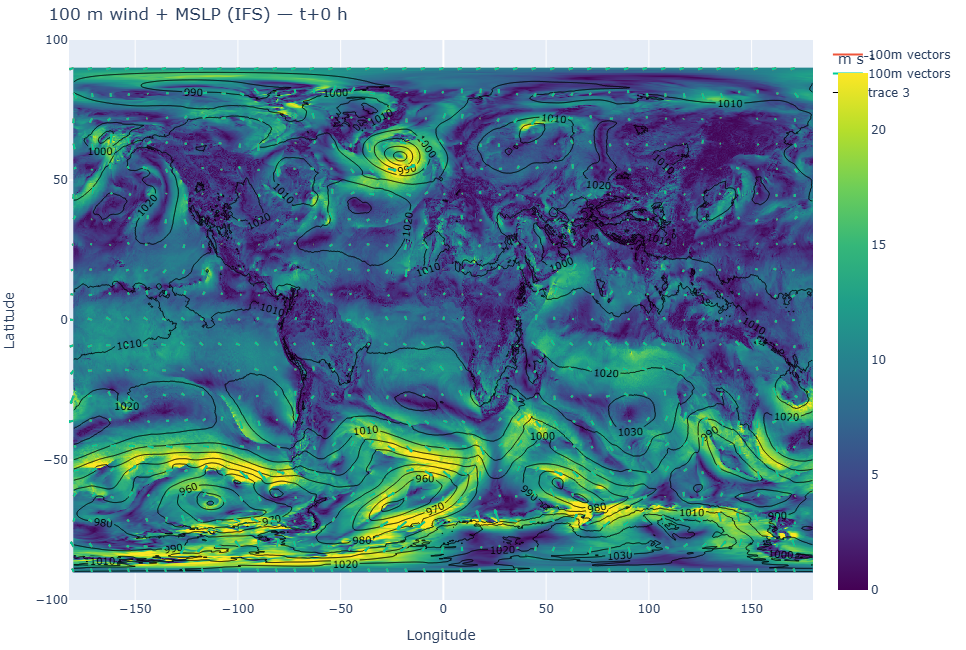

In [27]:
fig = add_quiver(fig, u100_t, v100_t, lat, lon, thin_target=40, scale=0.18, name="100m vectors")

msl_t = msl.isel(step=ti).values
cont = contour_mslp(msl_t, lat, lon)
for tr in cont.data: fig.add_trace(tr)
fig.update_layout(title=f"100 m wind + MSLP (IFS) — t+{int(STEPS[ti])} h")
fig.show()

In [22]:
lat.shape

(721,)